# _Boston Price Prediction_
**_Importing The Required Libraries & Packages_**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns
%matplotlib inline
import ydata_profiling as pf
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.metrics import r2_score
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
import pickle
import warnings
warnings.filterwarnings('ignore')

## _Dataset Cleaning:_
**_Making the loaded Boston dataset as an usable Dataset for prediction_**

In [2]:
boston = load_boston()
data = pd.DataFrame(boston.data)
data.columns = boston.feature_names
data['Price']=boston.target

**_Changing The Default Working Directory Path_**

In [3]:
os.chdir('C:\\Users\\chand\\OneDrive\\Desktop\\Boston House Price Prediction\\')

**_Exporting the dataset to a csv file for readability_**

In [4]:
data.to_csv('Boston House Price Data.csv',index=False)

**_Reading the Dataset using Pandas Command_**

In [5]:
df = pd.read_csv('Boston House Price Data.csv')
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


## _Data Visualization:_
**_Automated Exploratory Data Analysis (EDA) with ydata_profiling(pandas_profiling)_**

In [6]:
pf.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**_Getting the Correlation Values from all the numeric columns from the dataset and checking for correlation using Seaborn Heatmap & saving the PNG File_**

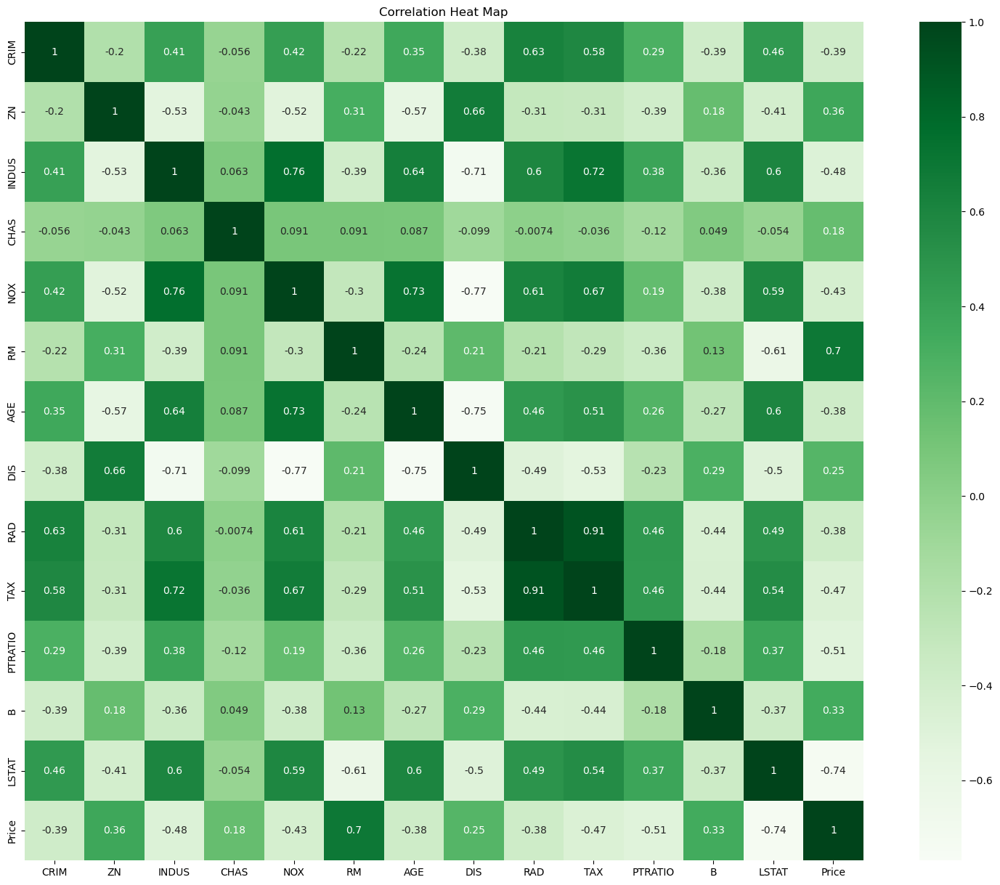

In [7]:
plt.rcParams['figure.figsize']=(20,15)
sns.heatmap(df.corr(),annot=True,cmap='Greens',square=True,cbar=True)
plt.title('Correlation Heat Map')
plt.savefig("Correlation Heat Map.png")
plt.show()

**_Assigning the dependent and independent variable_**

In [8]:
x = df.iloc[:,:-1]
y = df.iloc[:,-1]

## _Model Fitting:_
**_Defining the Function for the ML algorithms using GridSearchCV Algorithm and splitting the dependent variable & independent variable into training and test dataset and Predicting the Dependent Variable by fitting the given model and create the pickle file of the model with the given Algo_name. Further getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset._**

In [9]:
def FitModel(x,y,algo_name,algorithm,gridSearchParams,cv):
    np.random.seed(10)
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=99)
    grid = GridSearchCV(estimator=algorithm,param_grid=gridSearchParams,cv=cv,verbose=0,scoring='r2',
                       n_jobs=-1)
    grid_result = grid.fit(x_train,y_train)
    pickle.dump(grid_result,open(algo_name,'wb'))
    best_params = grid_result.best_params_
    y_pred = grid_result.predict(x_test)
    print('Algorithm Name:',algo_name)
    print('Best Params:',best_params)
    print('R2_score: {}%'.format(100*r2_score(y_test,y_pred)))

**_Running the function with empty parameters since the Linear Regression model doesn't need any special parameters and fitting the Linear Regression Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Linear Regression._**

In [10]:
params = {}
FitModel(x,y,'Linear Regression',LinearRegression(),params,cv=10)

Algorithm Name: Linear Regression
Best Params: {}
R2_score: 66.74690355194662%


**_Running the function with empty parameters since the Lasso model doesn't need any special parameters and fitting the Lasso Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Lasso._**

In [11]:
params = {}
FitModel(x,y,'Lasso',Lasso(),params,cv=10)

Algorithm Name: Lasso
Best Params: {}
R2_score: 61.24106278092214%


**_Running the function with empty parameters since the Ridge model doesn't need any special parameters and fitting the Ridge Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Ridge._**

In [12]:
params={}
FitModel(x,y,'Ridge',Ridge(),params,cv=10)

Algorithm Name: Ridge
Best Params: {}
R2_score: 65.85594318027415%


**_Running the function with some appropriate parameters and fitting the Decision Tree Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Decision Tree._**

In [13]:
params = { "max_features":['auto','sqrt'],
          "max_depth":[int(x) for x in np.linspace(6, 45, num = 5)],
          "min_samples_leaf":[1,2,5,10],
          "min_samples_split":[2, 5, 10, 15, 100],
          "min_weight_fraction_leaf":[0.0,0.1,0.2,0.3,0.4,0.5]}
FitModel(x,y,'Decision Tree',DecisionTreeRegressor(),params,cv=10)

Algorithm Name: Decision Tree
Best Params: {'max_depth': 35, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'min_weight_fraction_leaf': 0.0}
R2_score: 31.567773030632097%


**_Running the function with some appropriate parameters and fitting the Random Forest Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Random Forest._**

In [14]:
params = {'n_estimators':[500,600,800,1000],
         "criterion":["squared_error", "absolute_error", "poisson"]}
FitModel(x,y,'Random Forest',RandomForestRegressor(),params,cv=10)

Algorithm Name: Random Forest
Best Params: {'criterion': 'squared_error', 'n_estimators': 1000}
R2_score: 81.77911322019446%


**_Running the function with some appropriate parameters and fitting the Extra Trees Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name Extra Trees._**

In [15]:
params = {'n_estimators':[500,600,800,1000],
        'max_features':['auto','sqrt']}
FitModel(x,y,'Extra Tree',ExtraTreesRegressor(),params,cv=10)

Algorithm Name: Extra Tree
Best Params: {'max_features': 'auto', 'n_estimators': 500}
R2_score: 82.84555098585066%


**_Running the function with some appropriate parameters and fitting the XGBoost Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name XGBoost._**

In [16]:
params = {'n_estimators':[111,222,333,444]}
FitModel(x,y,'XGBoost',XGBRegressor(),params,cv=10)

Algorithm Name: XGBoost
Best Params: {'n_estimators': 333}
R2_score: 82.28556728208882%


**_Running the function with empty parameters since the CatBoost Regressor model doesn't need any special parameters and fitting the CatBoost Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name CatBoost._**

In [17]:
params = {}
FitModel(x,y,'Cat Boost',CatBoostRegressor(verbose=0),params,cv=10)

Algorithm Name: Cat Boost
Best Params: {}
R2_score: 83.4971033872248%


**_Running the function with empty parameters since the LightGBM Regressor model doesn't need any special parameters and fitting the LightGBM Regressor Algorithm and getting the Algorithm Name, Best Parameters of the algorithm, R2 Score in percentage format between the predicted values and dependent test dataset and also the pickle file with the name LightGBM._**

In [18]:
params = {}
FitModel(x,y,'LightGBM',LGBMRegressor(),params,cv=10)

Algorithm Name: LightGBM
Best Params: {}
R2_score: 81.57444056104549%


**_Loading the pickle file with the algorithm which gives highest r2 score percentage_**

In [19]:
model = pickle.load(open('Cat Boost','rb'))

**_Predicting the dependent variable using the loaded pickle file and getting the Accuracy Score in percentage format between the predicted values and dependent variable_**

In [20]:
y_pred = model.predict(x)
print('R2_score: {}%'.format(100*r2_score(y,y_pred)))

R2_score: 96.13517819696767%


**_Making the Predicted value as a new dataframe and concating it with the original data, so that we can able to compare the differences between Predicted price and Original Price._**

In [21]:
prediction = pd.DataFrame(y_pred,columns=['Predicted price(Approx.)'])
pred = pd.concat([df,prediction],axis=1)

**_Exporting the Data With Prediction of House Price to a csv file_**

In [22]:
pred.to_csv('Boston Predicted House Price.csv')

**_Plotting the line graph to represent the Accuracy between Predicted Price and Original Price and saving the PNG file_**

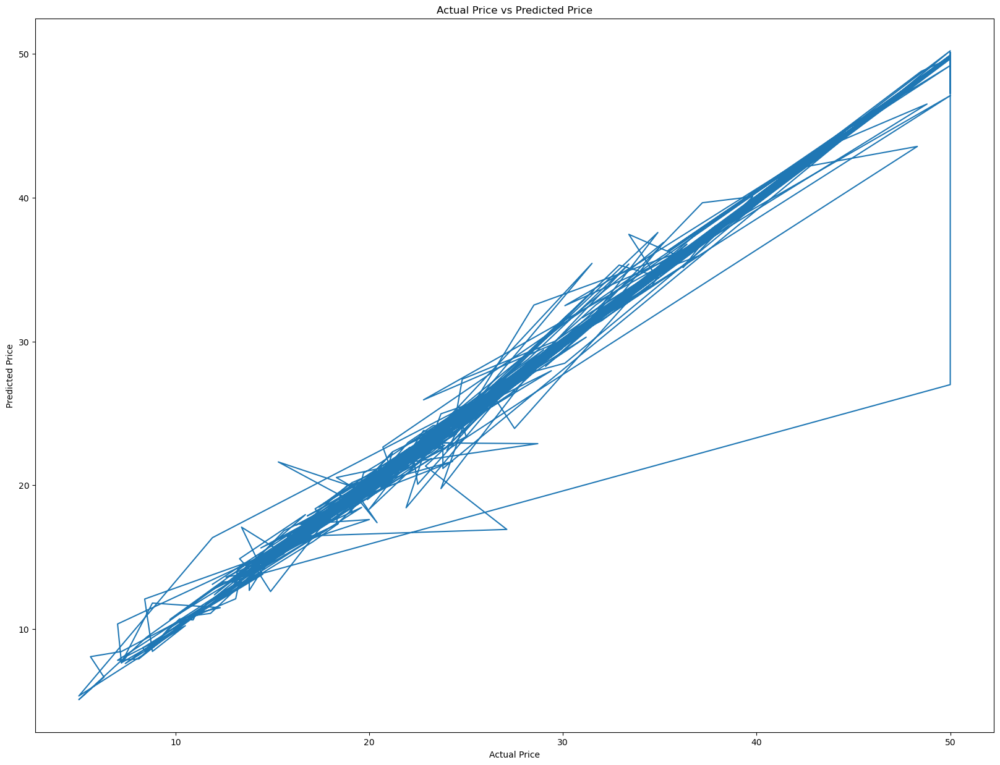

In [23]:
plt.plot(y,y_pred)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Actual Price vs Predicted Price')
plt.savefig('Actual Price vs Predicted Price.png')
plt.show()